## **Analysis of listing price pattern**
We need to understand the current market price of listing based on neighbourhood and room types to provide insights and recommendations of price for new airbnb partner in Bangkok. Some data that we need to use for the analysis consist of price, neighbourhood location, room type. For this analysis, we have some questions that consist of:
* What are the listing price ranges of airbnb listings in Bangkok
* Which neighbourhouds that have the highest price of listing? Which neighbourhoods that have the lowest price of listing? 
* Which room type that has the highest price? Which room type that has the lowest price?
* How to calculate the recommended listing price that represent the neighbourhood location and listing room type ?


Based on the previous observation, we know that the price data is not normally distributed and contains outliers. We want to know more detail regarding this info for improving our analysis. 

In [90]:
# Reviewing data distribution of 'price'
# Calculating minimum and maximum price
min_price = df['price'].min()
max_price = df['price'].max()

# Print the results
print(f'Minimum price = {min_price}')
print(f'Maximum price = {max_price}')


# Calculating Q1 (25th percentile), Q2 (50th percentile or median), Q3 (75th percentile), IQR (Inter Quartile Range)
# Calculate Q1 (25th percentile) and Q3 (75th percentile) of the 'price' column
Q1 = df['price'].quantile(0.25)
Q2 = df['price'].quantile(0.5)
Q3 = df['price'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

print(f"Q1 'price' = {Q1}")
print(f"Q2 'price' = {Q2}")
print(f"Q3 'price' = {Q3}")
print(f"Interquartile Range (IQR) 'price' = {IQR}")

# Detecting outlier
# Method for checking outlier by using lower and upper boundary
# Define the lower and upper bounds for outlier detection
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print("lower_bound of 'price' =", lower_bound)
print("upper_bound of 'price' =", upper_bound)

Minimum price = 278
Maximum price = 1100000
Q1 'price' = 900.0
Q2 'price' = 1429.0
Q3 'price' = 2429.0
Interquartile Range (IQR) 'price' = 1529.0
lower_bound of 'price' = -1393.5
upper_bound of 'price' = 4722.5


There is extremely large spread of price. The lowest price is 278 Thai Baht, while the highest price is 1.100.000 Thai Baht.

In [91]:
# Calculating outlier in 'price' column
# Method for checking outlier using lower and upper boundary
# Define the lower and upper bounds for outlier detection
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Calculating the number of outliers in the 'price' column
outliers_count = ((df['price'] < lower_bound) | (df['price'] > upper_bound)).sum()

# Print the result
print("total number of outlier in the 'price' column:", outliers_count)

total number of outlier in the 'price' column: 1403


As the price is largely spread and we have many outliers as well, we are trying to plot the distribution by dividing into two separated plots: 
1. Price below upperbound (less than 4772.5 Thai Bhat) 
2. Price above upperbound (higher than 4772.5 Thai Baht)

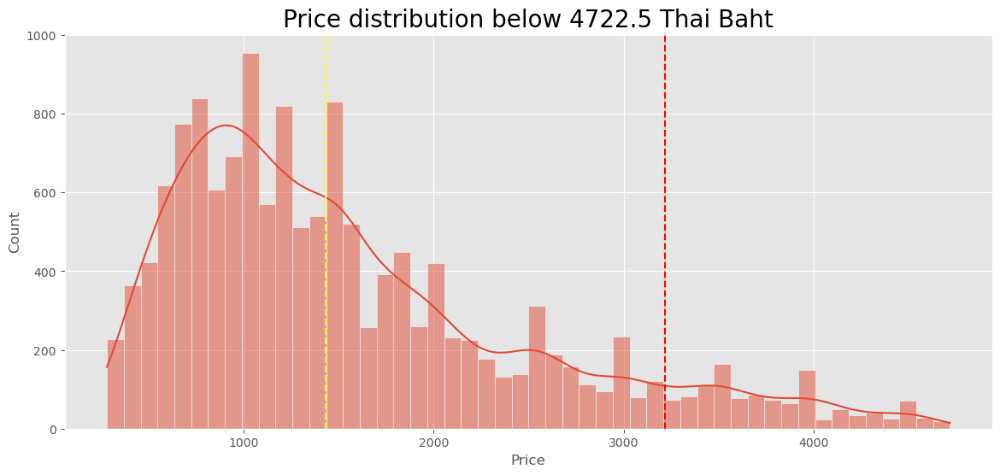

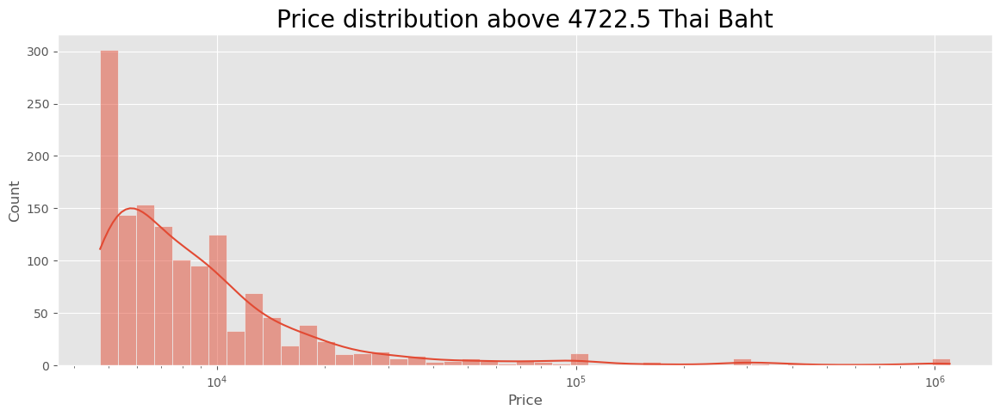

In [92]:
# price distribution

plt.figure(figsize=(14,6))
sns.histplot(data=df[df['price'] < upper_bound], x='price', bins=50,  kde=True)
plt.axvline(x=df['price'].mean(), color='red', linestyle='--', label='Mean') # pointing mean
plt.axvline(x=df['price'].median(), color='yellow', linestyle='--', label='Median') # pointing median
plt.title(f'Price distribution below {upper_bound} Thai Baht', fontsize=20)
plt.xlabel('Price')


plt.figure(figsize=(14,5))
sns.histplot(data=df[df['price'] >= upper_bound], x='price', kde=True, log_scale=True)
plt.title(f'Price distribution above {upper_bound} Thai Baht', fontsize=20)
plt.xlabel('Price')

# Displaying histogram
plt.show()

It turns out price data distribution is heavily skewed to the right due to high number of outliers. This also indicate that it will be better to use median instead of mean for observing central tendency as median value is more robust to outliers.

**Listing prices based on neighbourhood locations**

We want to check how listing price is distributed according to the neighbourhood locations in Bangkok 

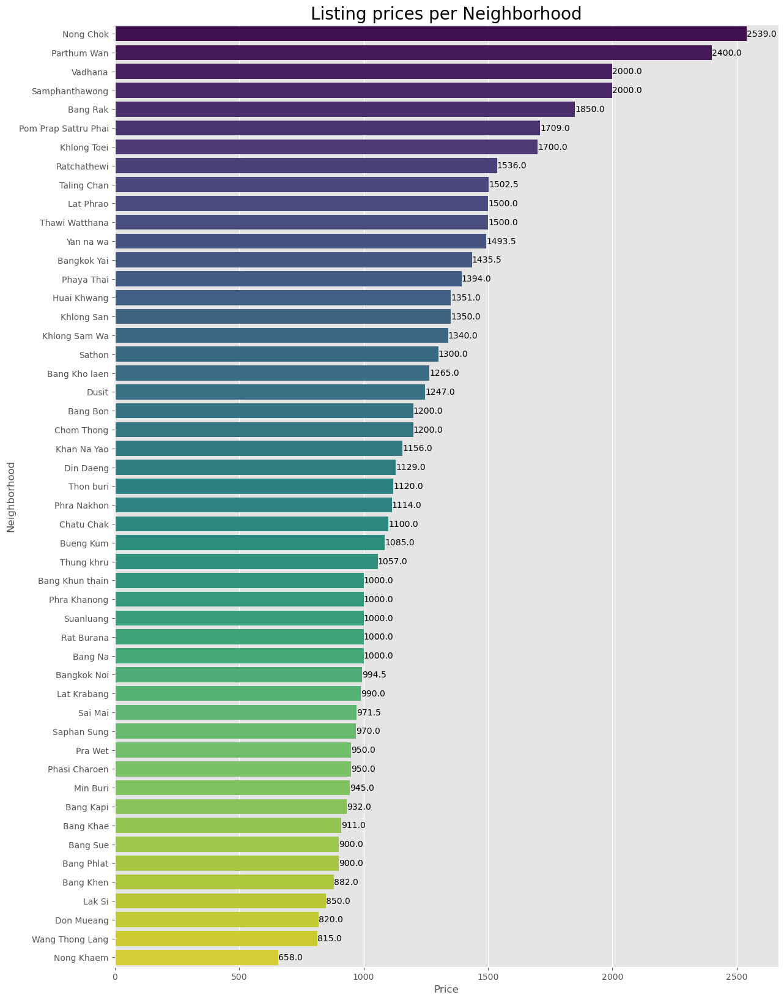

In [93]:
# Listing prices per neighbourhood 
df_neighborhood_price = df.groupby('neighbourhood')[['price']].median().sort_values(by='price',ascending=False).reset_index()
df_neighborhood_price

# Creating bar plot
plt.figure(figsize=(14, 20))
ax = sns.barplot(data=df_neighborhood_price, y='neighbourhood', x='price', ci=None,  palette='viridis')

# Menambahkan nilai median di setiap bar
for i, (index, row) in enumerate(df_neighborhood_price.iterrows()):
    ax.text(row['price'], i, f"{row['price']}", va='center', fontsize=10)

plt.xlabel('Price')
plt.ylabel('Neighborhood')
plt.title('Listing prices per Neighborhood', fontsize=20)
plt.show()


The neighbourhoods with the highest price are located in Nong chok, Parthum Wan, Vadhana, Samphanthawong, Bang Rak,
Pom Prap Sattru Phai, Khlong Toei, Ratchathewi, Taling Chan, Lat Phrao.
While the neighborhoods with the lowest price are located in Nong Khaem, Wang Thong Lang, Don Mueang, Lak Si, Bang Khen, Bang phlat, Bang Sue, Bang Khae, Bang Kapi, Min Buri.

**Neighbourhood with highest and lowest listing price on Bangkok map**

Now, we want to check the location of both neighbourhood with highest and lowest listing price on the Bangkok map using folium

In [94]:
# The neighbourhood with the highest and lowest price of listings on Bangkok map 


# Creating Bangkok map with boundary
bangkok_map = folium.Map(
    location=[13.7563, 100.5018],
    zoom_start=12,
    tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}{r}.png',
    attr='Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors | Tiles &copy; <a href="https://carto.com/attributions">CARTO</a>',
    max_bounds=True,
    min_zoom=10, 
    max_bounds_viscosity=1.0,
    max_zoom=15,  
    max_bounds_readable=True  
)

# Coordinate boundary of Bangkok
bangkok_bounds = [[13.5, 100.25], [14.0, 100.9]]

# Adding map boundary as limitation for Bangkok area
folium.Rectangle(
    bounds=bangkok_bounds,
    fill=False,
    color='blue',
    weight=2,
    fill_opacity=0
).add_to(bangkok_map)

# Initiating MarkerCluster
listings = plugins.MarkerCluster().add_to(bangkok_map)

# Attaching marker to MarkerCluster
for lat, long, label in list(zip(df['latitude'], df['longitude'], df['room_type'])):
    folium.Marker(
        [lat, long],
        popup=label,
        icon=None
    ).add_to(listings)
    
# Adding markers for specific locations in Bangkok (red icon)
folium.Marker([13.7445, 100.4966], popup='Sukhumvit', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Most central area, Shopping centers, dining/restaurants, bars and many excellent accomodation. Near to BTS sky train.
folium.Marker([13.7233, 100.4762], popup='Siam', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Famous shopping malls (Siam Square and Central World), tourist attractions like Siam ocean World (aquarium), Madame Tusssaud's Wax museum. Near to BTS sky train
folium.Marker([13.7249, 100.493], popup='Silom', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Financial district, many bank headquarters, financial institutions & offices. Hundreds of restaurant and foodsthalls. Near MRT subway, BTS sky train.
folium.Marker([13.7314, 100.5148], popup='Ratchathewi', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Distric in central Bangkok, access to BTS skytrain, access to International airport (via Makkasan), Bangkok landmark 

# Adding markers for airports in Bangkok
folium.Marker([13.6902, 100.7501], popup='Suvarnabhumi Airport', icon=folium.Icon(icon='yellow', prefix='fa', color='orange')).add_to(bangkok_map) # airport
folium.Marker([13.9129, 100.6077], popup='Don Mueang', icon=folium.Icon(icon='yellow', prefix='fa', color='orange')).add_to(bangkok_map) # airport

# Add markers for specific locations in Bangkok with the highest price (orange icon)
folium.Marker([13.8563, 100.8625], icon=folium.Icon(color='orange'), popup='Nong Chok').add_to(bangkok_map)
folium.Marker([13.7462, 100.5308], icon=folium.Icon(color='orange') ,popup='Parthum Wan').add_to(bangkok_map)
folium.Marker([13.7350, 100.5828], icon=folium.Icon(color='orange'), popup='Vadhana').add_to(bangkok_map)
folium.Marker([13.7362, 100.5136], icon=folium.Icon(color='orange'), popup='Samphanthawong').add_to(bangkok_map)
folium.Marker([13.7262, 100.5282], icon=folium.Icon(color='orange'), popup='Bang Rak').add_to(bangkok_map)
folium.Marker([13.7397, 100.5073], icon=folium.Icon(color='orange'), popup='Pom Prap Sattru Phai').add_to(bangkok_map)
folium.Marker([13.7080, 100.5839], icon=folium.Icon(color='orange'), popup='Khlong Toei').add_to(bangkok_map)
folium.Marker([13.7589, 100.5347], icon=folium.Icon(color='orange'), popup='Ratchathewi').add_to(bangkok_map)
folium.Marker([13.7769, 100.4566], icon=folium.Icon(color='orange'), popup='Taling Chan').add_to(bangkok_map)
folium.Marker([13.8036, 100.6075], icon=folium.Icon(color='orange'), popup='Lat Phrao').add_to(bangkok_map)
folium.Marker([13.7996, 100.4327], icon=folium.Icon(color='orange'), popup='Thawi Watthana').add_to(bangkok_map)

# Add markers for specific locations in Bangkok with the lowest price (green icon)
folium.Marker([13.7043, 100.3485], icon=folium.Icon(color='green'), popup='Nong Khaem').add_to(bangkok_map)
folium.Marker([13.7861, 100.6029], icon=folium.Icon(color='green'), popup='Wang Thong Lang').add_to(bangkok_map)
folium.Marker([13.9129, 100.5899], icon=folium.Icon(color='green'), popup='Don Mueang').add_to(bangkok_map)
folium.Marker([13.8875, 100.5788], icon=folium.Icon(color='green'), popup='Lak Si').add_to(bangkok_map)
folium.Marker([13.8852, 100.5968], icon=folium.Icon(color='green'), popup='Bang Khen').add_to(bangkok_map)
folium.Marker([13.7936, 100.5011], icon=folium.Icon(color='green'), popup='Bang Phlat').add_to(bangkok_map)
folium.Marker([13.8095, 100.5371], icon=folium.Icon(color='green'), popup='Bang Sue').add_to(bangkok_map)
folium.Marker([13.6965, 100.4097], icon=folium.Icon(color='green'), popup='Bang Khae').add_to(bangkok_map)
folium.Marker([13.7652, 100.6476], icon=folium.Icon(color='green'), popup='Bang Kapi').add_to(bangkok_map)
folium.Marker([13.8134, 100.7484], icon=folium.Icon(color='green'), popup='Min Buri').add_to(bangkok_map)

# Displaying map
bangkok_map

Based on the Bangkok map above, we can see that the neighbouhoods with highest price (orange icon) mostly located near the tourims attraction (red icon) like Sukhumvit, Siam, and Silom. While the neighbourhoods with lowest price (green icon) mostly situated on outer Bangkok or quite far from city centre of Bangkok. 

**Listing price distribution based on room types**

We want to check the data distribution by including room type into distribution as the graph below,

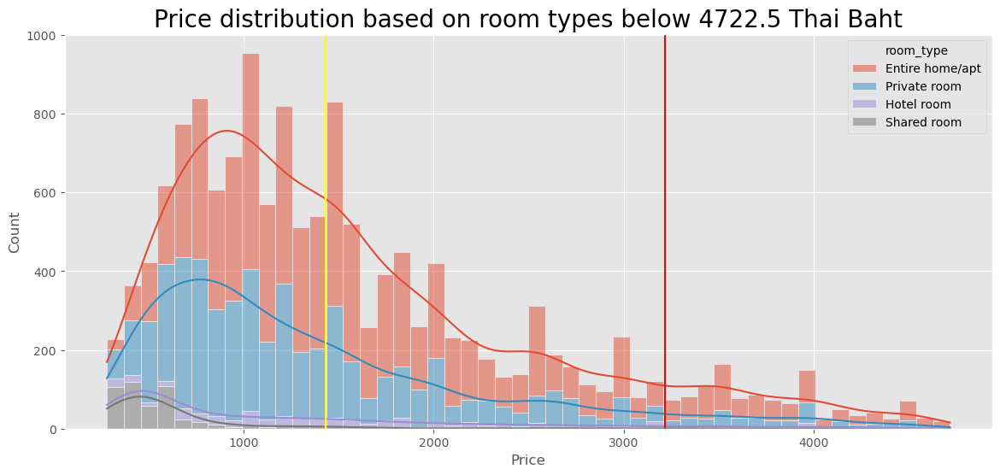

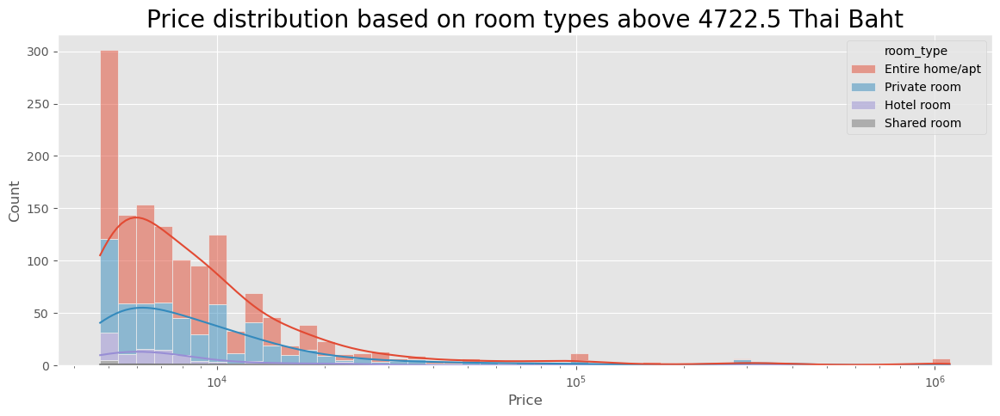

In [95]:
# Histogram of prices according to room types

plt.figure(figsize=(14,6))
sns.histplot(data=df[df['price'] < upper_bound], 
             x='price', 
             bins=50, 
             hue='room_type', 
             hue_order=['Entire home/apt','Private room','Hotel room','Shared room'], 
             multiple='stack', 
             kde=True)
plt.axvline(x=df['price'].mean(), color='red') # mean
plt.axvline(x=df['price'].median(), color='yellow') # median
plt.title(f'Price distribution based on room types below {upper_bound} Thai Baht', fontsize= 20)
plt.xlabel('Price')
plt.show()

plt.figure(figsize=(14,5))
sns.histplot(data=df[df['price'] >= upper_bound], 
             x='price', 
             hue='room_type', 
             hue_order=['Entire home/apt','Private room','Hotel room','Shared room'], 
             multiple='stack', 
             kde=True, 
             log_scale=True)
plt.title(f'Price distribution based on room types above {upper_bound} Thai Baht', fontsize= 20)
plt.xlabel('Price')
plt.show()

Based on the visualization above, we can see distribution of price between room type. The entire home/apt visually has the highest number of outliers among the other room types.

**Box plot of listing price based on room type**

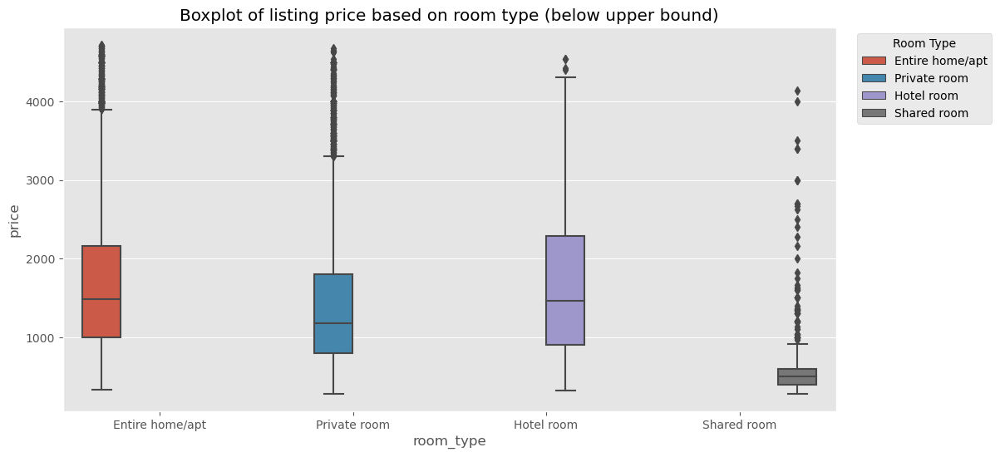

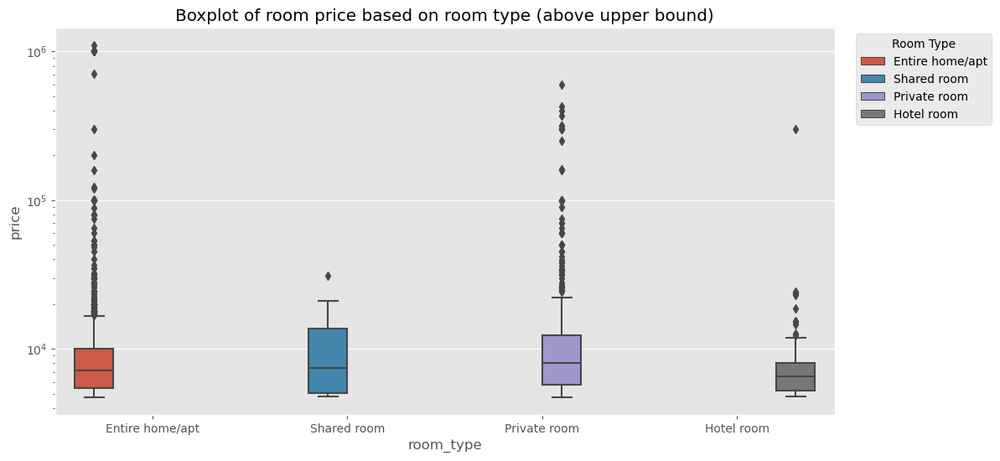

In [96]:
# Boxplot of price per room type
# Filtering the DataFrame based (lower than upper bound)
filtered_df = df[df['price'] < upper_bound]

# Creating the boxplot of price (lower than upper bound)
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=filtered_df, y='price', x='room_type', hue='room_type', ax=ax)
ax.set_title('Boxplot of listing price based on room type (below upper bound)')
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Room Type')
plt.show()

# Filtering the DataFrame based on the condition (above upper bound)
filtered_df_upper = df[df['price'] >= upper_bound]

# Creating the boxplot of price with logarithmic scale on y-axis
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=filtered_df_upper, y='price', x='room_type', hue='room_type', ax=ax)
ax.set_title('Boxplot of room price based on room type (above upper bound)')
ax.set_yscale('log')  # Set y-axis scale to logarithmic
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Room Type')
plt.show()

By using boxplot for visualization, we can see outliers on each room type more clearly. However, its quite difficult to compare the central tendency of each treatment using boxplot, due to their data distribution. So, we decide to use bar plot for comparing the price among room type and we use median value as the it is robust to outliers

**Bar plot of listing price based on room types**

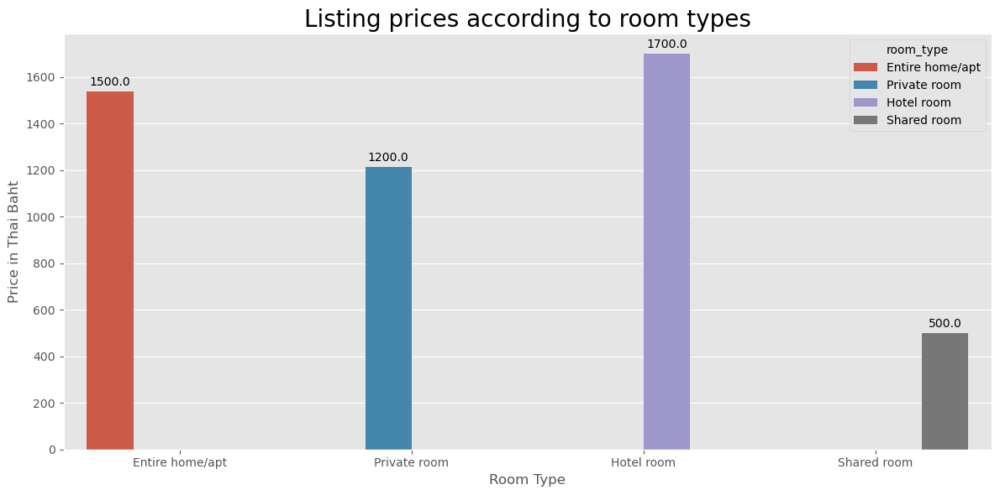

In [97]:
# Listing prices according to room types

# Setting size
plt.figure(figsize=(12,6))

# Creating bar plot
ax = sns.barplot(data=df,
            x='room_type',
            y='price',
            hue='room_type',
            estimator=np.median,
            ci=0)
# Creating annotation function in bar
for bar in ax.patches:
    ax.annotate(format(round(bar.get_height(), -2)),
                   (bar.get_x() + bar.get_width() / 2,
                   bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel('Room Type')
plt.ylabel('Price in Thai Baht')
plt.title('Listing prices according to room types', fontsize=20)
plt.tight_layout()
plt.show()

Based on the bar plot above, we can see the room type of hotel room has the highest listing price and the share room has the lowest listing price. In addition to that, we want to confirm that the price is significantly different among other room type. So, we try to perform statistical test (kruskal wallis) for confirming.In addition to that, we want to confirm that the price is significantly different among other room type. So, we try to perform statistical test (kruskal wallis) for confirming.

**Kruskal Wallis test of price among room types**

In [98]:
# Kruskal Wallis test for confirming there are significant differences of price among room types
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['room_type'] == 'Entire home/apt']['price'],
    df[df['room_type'] == 'Private room']['price'],
    df[df['room_type'] == 'Hotel room']['price'],
    df[df['room_type'] == 'Shared room']['price']
)
pvalue


alpha = 0.05

if pvalue > alpha:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue > {alpha}. We cannot reject the null hypothesis. There no is sufficient evidence to conclude 
    that there is a minimum of one room type which has price that significantly different to other room types.
    ''')
else:
    print(f'''
    The result of kruskal wallis test: pvalue = {pvalue:.5f}. pvalue <= {alpha}. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has price that significantly different to other room types.  
    ''')


    The result of kruskal wallis test: pvalue = 0.00000. pvalue <= 0.05. We can reject the null hypothesis. There is sufficient evidence to conclude 
    that there is a minimum of one room type which has price that significantly different to other room types.  
    


Based on the result of Kruskal Wallis test, we get p-value that is less than 0.05. This indicates there is significant differences of listing price between room type.

**Bivariat analysis: Listing price based on neighbourhood and room type**

After knowing the the overview of the relationship between price and room type, and price and neighbourhood, we conduct bivariat analysis to find the intersection price between those variables. 

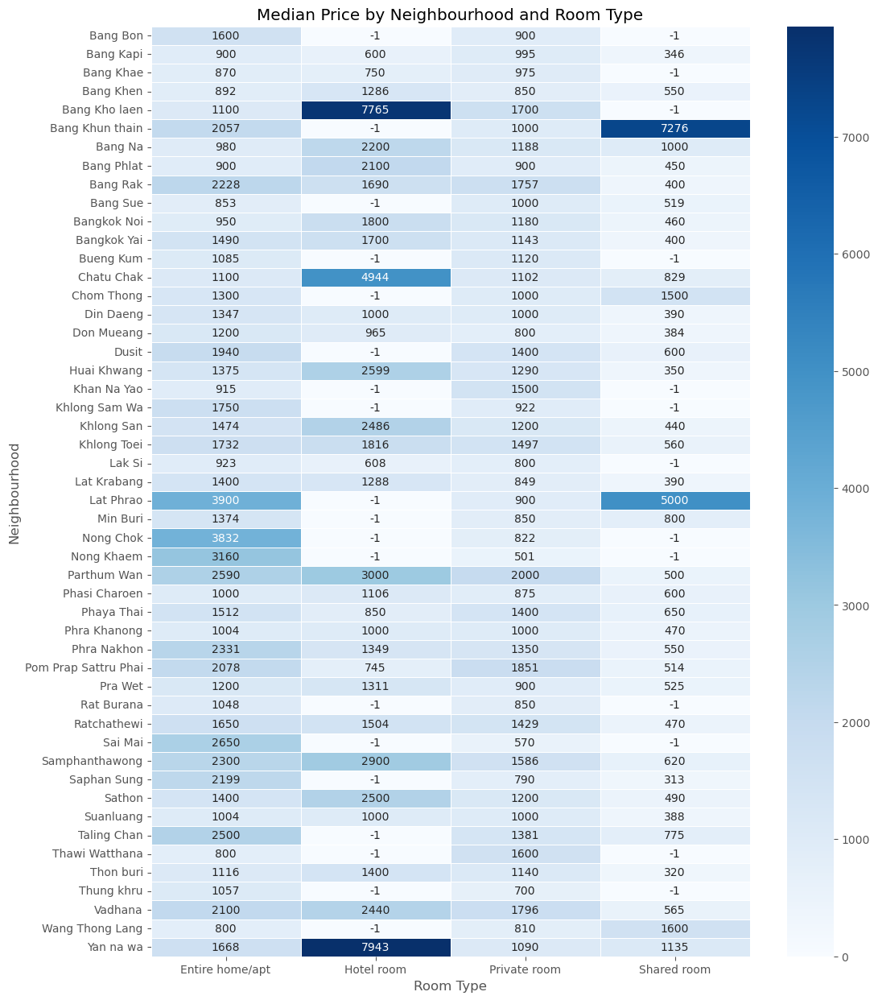

In [99]:
# Bivariat analysis using crosstab for determination of listing price based on neighbourhood and room type
# Price based on neighbourhood and room tyoe
price_area_room_type_cs = pd.crosstab(
               index=df['neighbourhood'],
               columns=df['room_type'],
               values=df['price'],
               aggfunc='median'
)

# Menggantikan nilai NaN dengan '-1'
price_area_room_type_cs = price_area_room_type_cs.fillna(-1)

# Create heatmap
plt.figure(figsize=(12, 15))
sns.heatmap(price_area_room_type_cs, annot=True, fmt='.0f', cmap='Blues', linewidths=.5)
plt.title('Median Price by Neighbourhood and Room Type')
plt.xlabel('Room Type')
plt.ylabel('Neighbourhood')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

From the table above, there are values that missing due to absent of room type in the particular neighbourhood. The listing prices above are calculated using median values of listing according to neighbourhoods and room types. So these price can potentially represent as basic price of the current market price situation. However, there will be always exception to this price, as it is difficult to generalize the price among listing providers.  

**Insights of listing price pattern:**
* The current airbnb listing price extremely is diverse. The lowest price is 278 Thai Baht, while the highest price is 1.100.000 Thai Baht.
* The neighbourhood with highest price is Nong chok, Parthum Wan, Vadhana, Samphanthawong, Bang Rak,Pom Prap Sattru Phai, Khlong Toei, Ratchathewi, Taling Chan, Lat Phrao. While the neighborhood with lowest price is Nong Khaem, Wang Thong Lang, Don Mueang, Lak Si, Bang Khen, Bang phlat, Bang Sue, Bang Khae, Bang Kapi, Min Buri. The neighbourhood with low listing price are usually located in outer Bangkok, while the neighbourhood with high listing price mostly located and concentrated in the center of Bangkok.
* The highest listing price according to room type is hotel room. In contrast, the cheapest one is the shared room. There is a significant difference of price among to room types.
* Bivariat analysis of price using crosstab can be used for determination of the recommended listing price that represent neighbourhood location and listing room type.

**More insight for the new airbnb partner:**
* Although it cannot be always generalized due to difference between listing, however, consider to formulate the pricing strategy close to the recommended listing price based on room type and nighbourhood location

- To be continued to the data analysis part 4